In [17]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
from matplotlib.colors import Normalize

warnings.filterwarnings('ignore')

In [18]:
def makePlots(filename, vmin=-0.1, vmax=0.1):
    data = Table.read(filename, format='fits')
    R, vR, vT, z, vz, phi = data['R', 'vR', 'vT', 'z', 'vz', 'phi'].as_array().view((np.float64, 6)).T
    phi[phi > np.pi] -= 2*np.pi
    del data
    
    mask = (R > 3/8.) & (R < 13/8.) & (phi > -np.pi/18) & (phi < np.pi/18) & (vT > 0.1) & (vT < 1.7)
    H, xedges, yedges = np.histogram2d(R[mask], vT[mask], bins=500)
    H = H.T
    
    M = np.nanmax(H, axis=0)
    m = np.nanmin(H, axis=0)
    H_normed = (H - m.T) / (M - m)
    
    vR_bins = np.histogram2d(R[mask], vT[mask], bins=(xedges, yedges), weights=vR[mask])[0]
    vR_bins = vR_bins.T
    vR_mean_bins = vR_bins/H
    
    fig, ax = plt.subplots(1, 3, figsize=(20, 8), gridspec_kw={'width_ratios':[15, 15, 1]})
    
    ax[0].imshow(H_normed, origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], aspect='auto')
    ax[0].set_xlabel('$R/R_0$')
    ax[0].set_ylabel('$v_{\phi}/v_0$')
    
    im = ax[1].imshow(vR_mean_bins, origin='low', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], aspect='auto', vmin=vmin, vmax=vmax, cmap='bwr')
    ax[1].set_xlabel('$R/R_0$')
    ax[1].set_ylabel('$v_{\phi}/v_0$')
    plt.colorbar(im, cax=ax[2], label='$v_R$')
    
    plt.subplots_adjust(wspace=0.15)
    pos1 = ax[2].get_position()
    pos2 = [pos1.x0 - 0.025, pos1.y0, pos1.width, pos1.height] 
    ax[2].set_position(pos2)
    
    plt.show()

# Old Initial Conditions, Structureless

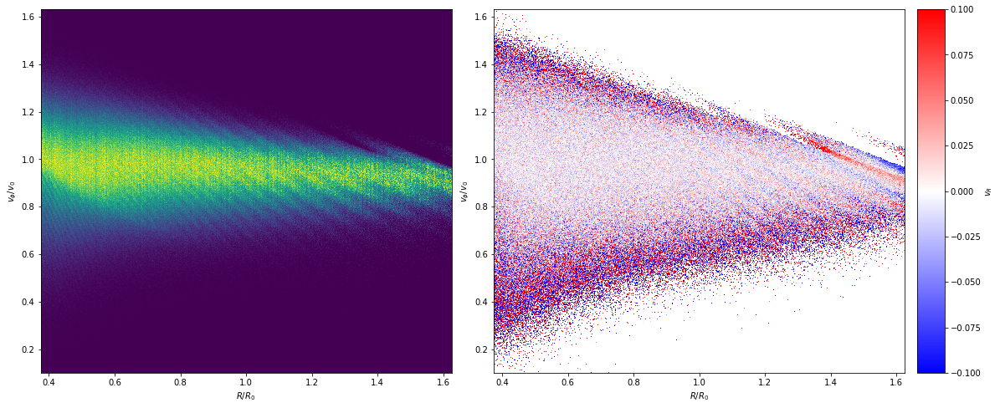

In [3]:
filename = os.path.expandvars('$SCRATCH/data/structureless/01-old-2Gyr/structureless_99.fits')
makePlots(filename)

# New Initial Conditions, Structureless

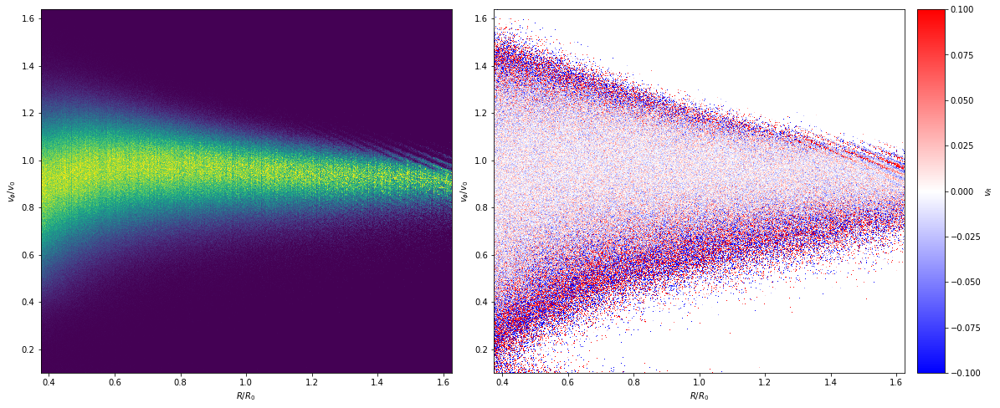

In [4]:
filename = os.path.expandvars('$SCRATCH/data/structureless/03-new-7Gyr/new-7Gyr_0.fits')
makePlots(filename)

# Short Fast Bar (old)

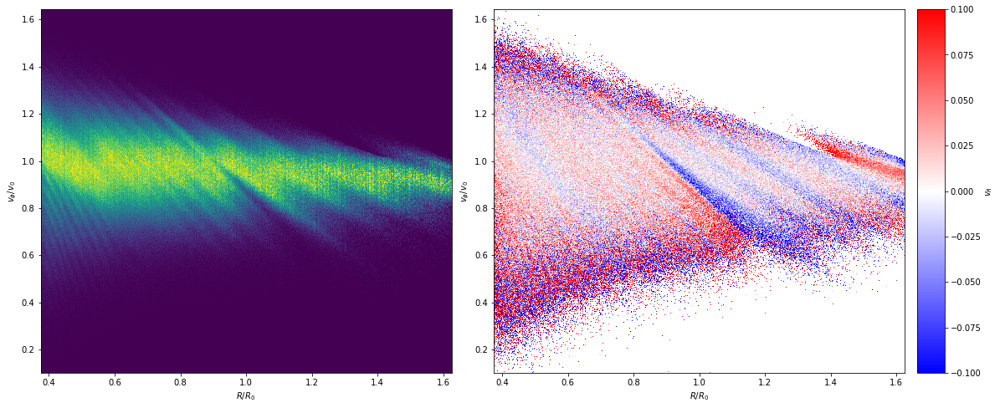

In [5]:
filename = os.path.expandvars('$SCRATCH/data/bars/short_fast_bar/100000000_samples_0.fits')
makePlots(filename)

# Long Slow Bar (old)

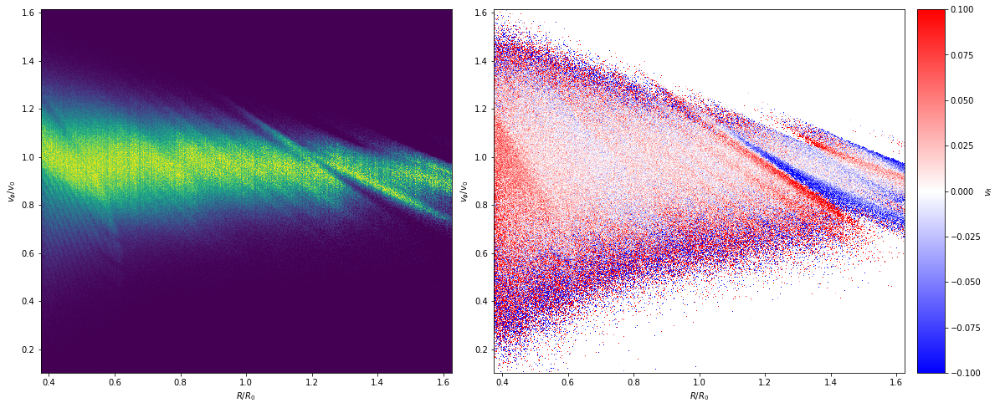

In [6]:
filename = os.path.expandvars('$SCRATCH/data/bars/long_slow_bar/100000000_samples_0.fits')
makePlots(filename)

# Faster Slow Bar (old)

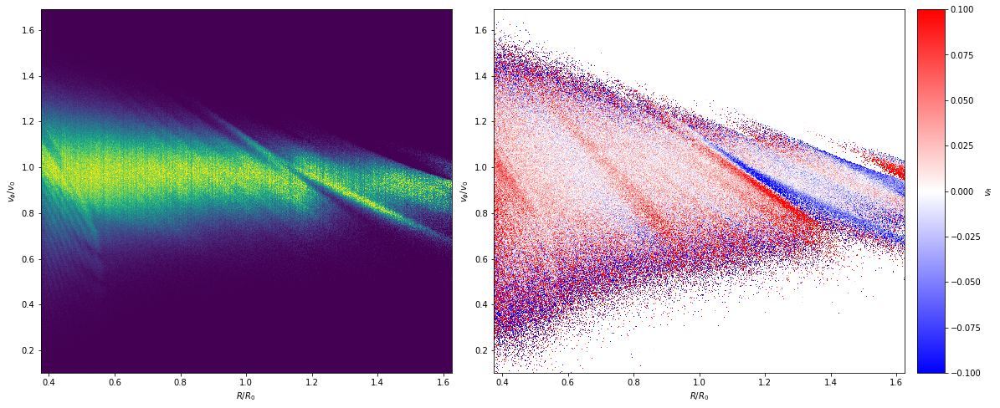

In [7]:
filename = os.path.expandvars('$SCRATCH/data/bars/faster_slow_bar/100000000_samples_0.fits')
makePlots(filename)

# Short fast bar, short integration time (old)

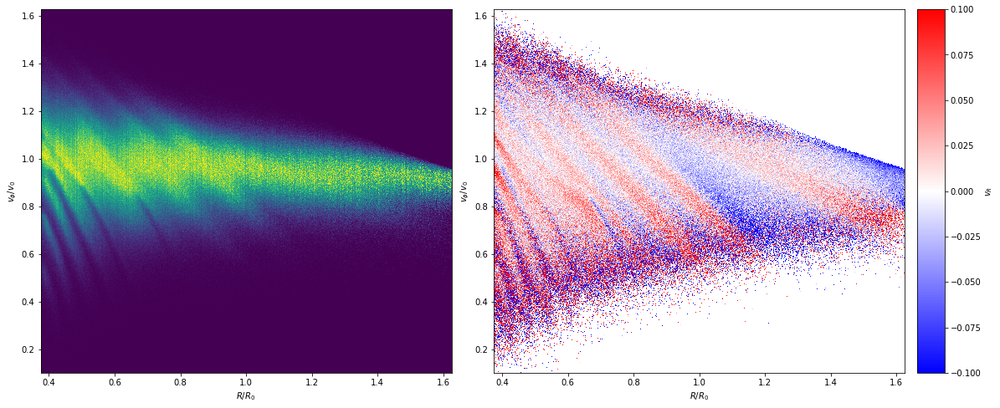

In [8]:
filename = os.path.expandvars('$SCRATCH/data/bars/sfb_short/sfb_short.fits')
makePlots(filename)

# Density Wave + Long Slow Bar (old)

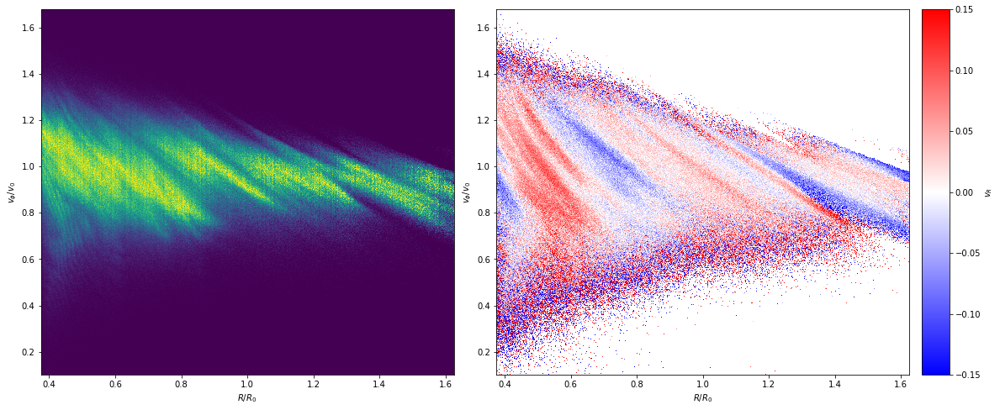

In [20]:
filename = os.path.expandvars('$SCRATCH/data/density_waves/density_waves_99.fits')
makePlots(filename, vmin=-0.15, vmax=0.15)

# Base Transient Sprials + LSB (old)

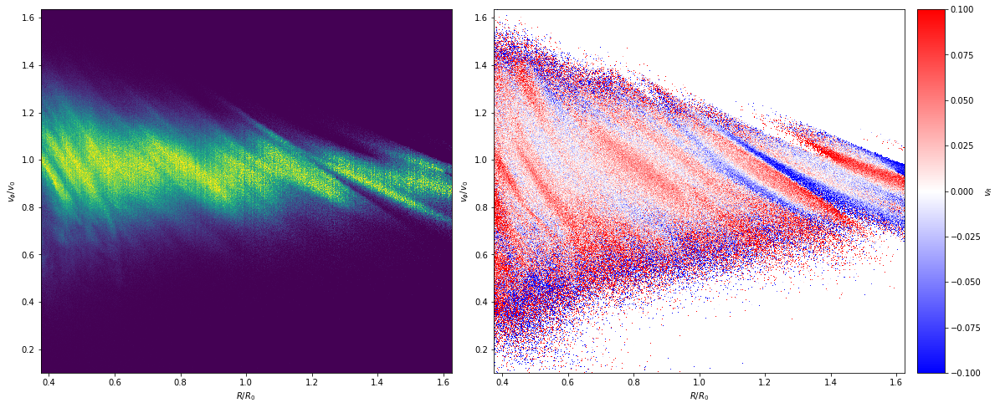

In [10]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/01-base/transient_spiral_99.fits')
makePlots(filename)

# Base Transient Sprials + LSB (new)

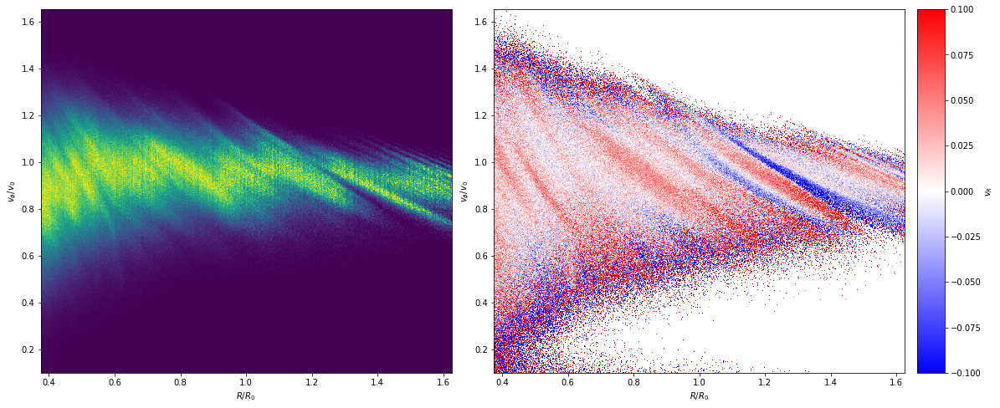

In [11]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/04-base-new-init/base-new-init_99.fits')
makePlots(filename)

# Base Transient Sprials, Continued for 2 Gyr (new)

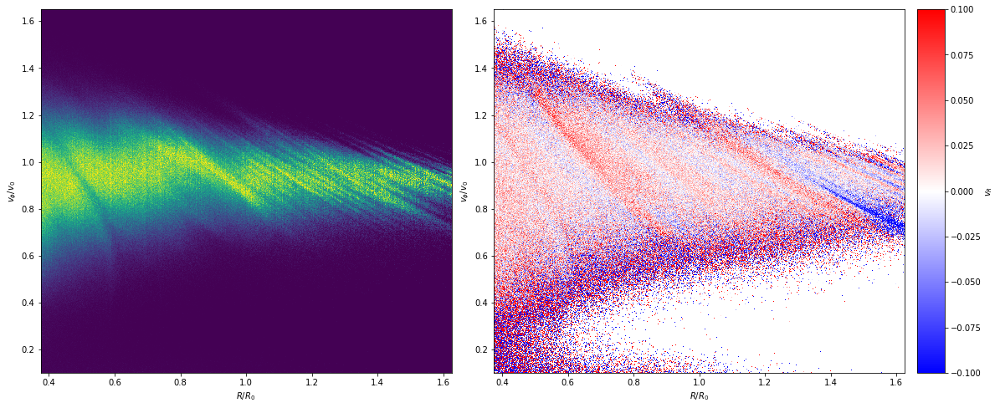

In [12]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/05-base-continued-2Gyr/base-continued-2Gyr_99.fits')
makePlots(filename)

# 5 Transient Arm Cycles + LSB (old)

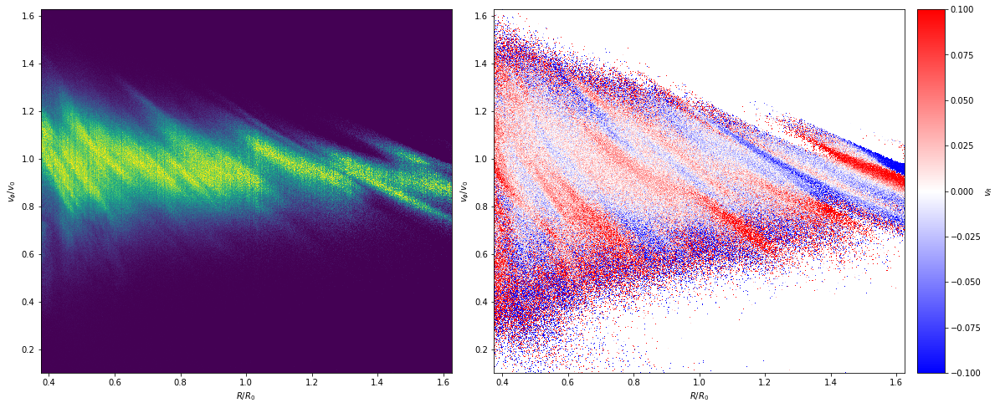

In [13]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/03-more-spirals/more-spirals_99.fits')
makePlots(filename)

# Longer Lifetime Transient Arms + LSB (old)

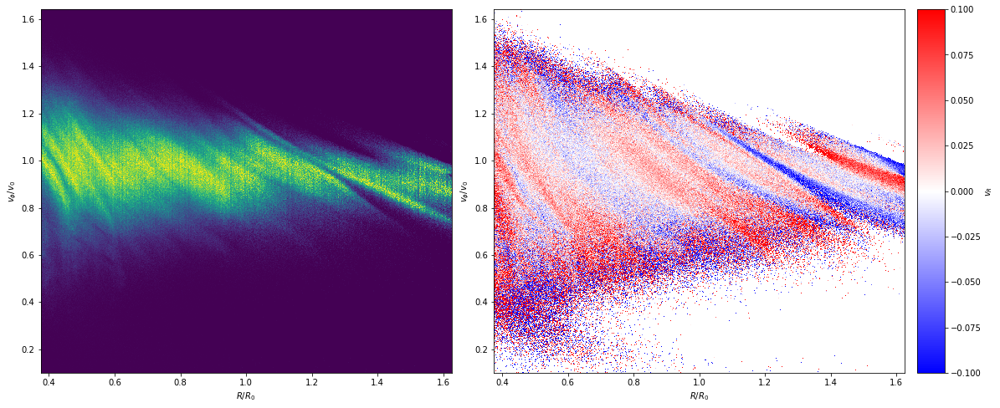

In [14]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/02-longer-lifetime/longer-lifetime_99.fits')
makePlots(filename)

# Spiral Only, Single Cycle, $\pm 4 \sigma$ (new)

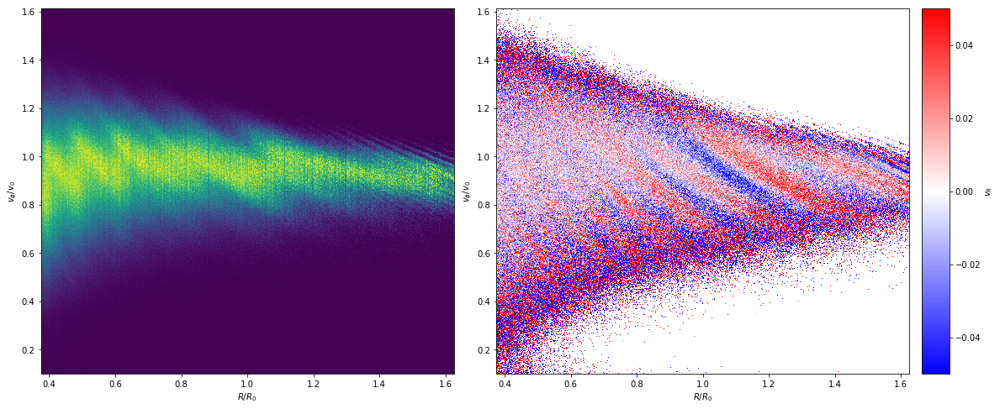

In [15]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/06-single-cycle/single-cycle_100.fits')
makePlots(filename, vmin=-0.05, vmax=0.05)

# Spiral Only, Single Cycle, $4 \sigma$ + 2 Gyr (new)

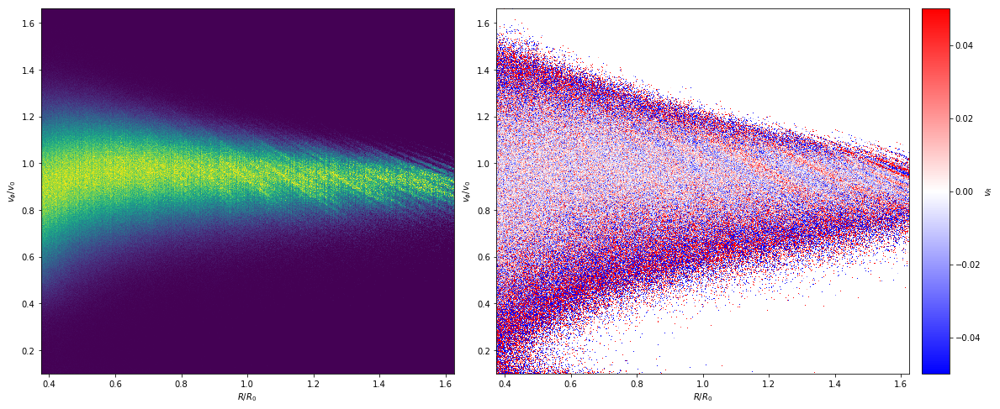

In [16]:
filename = os.path.expandvars('$SCRATCH/data/transient_spirals/07-single-cycle-continued/single-cycle-continued_99.fits')
makePlots(filename, vmin=-0.05, vmax=0.05)